In [1]:
%load_ext autoreload
%autoreload 2

# This notebook illustrates how to migrate annotations to visium spot space in the form of an AnnData object

In this notebook, we will load the TissueTag annotated image of a visium H&E reference image. 
Then we will translate the pixel level annotations to an hexagonal binned grid and measure the minimal euclidean distances to the annotations and calculate 2 types of biological axes(OrganAxis). Finally we will migrate annotations to visium space and print some plots.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
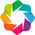

In [2]:
import os
import numpy as np
import pandas as pd
from matplotlib.pyplot import figure
os.chdir('/nfs/team205/ny1/playground/tissutag_andr/tissue_tag/')
import tissue_tag as tt
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

# Part 1 - Load image and define annotation names and colors 

In [14]:
# set path
path_to_tissue_tag = '/nfs/team205/ny1/playground/tissutag_andr/'
path = path_to_tissue_tag + '/data/tissue_tag_minimal_example_visium/' 

In [18]:
# load tissue annotations from TissueTag and migrate annotation to a 15um hexagonal grid and outputs the coordinates in ppm=1 
df_anno = tt.anno_to_grid(
    folder=path+'/tissue_annotations/',
    file_name = 'annotations',
    spot_diameter = 15,
    load_colors=True,
)
df_anno['annotations'].value_counts()

loaded annotation image - annotations size - (3957, 3886)
loaded annotations
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS', 9: 'Other'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Artifacts': 'black', 'Medulla': 'green', 'Cortex': 'cyan', 'Edge': 'brown', 'HS': 'magenta', 'Vessels': 'blue', 'PVS': 'red', 'Other': 'orange'}
Generating grid with spot size - 15, with resolution of - 0.5 ppm


annotations
unassigned    153153
Cortex         74410
Medulla        23048
Edge           13990
Artifacts       4545
Other           2308
PVS             1182
HS               833
Vessels           35
Name: count, dtype: int64

# Part 2 - calculate distances to annotations and axes  

In [19]:
# here we calculate the relative distances of each spot in the grid to the closest corresponding spot from all annotations
print('calculating distances')
tt.dist2cluster_fast(
    df=df_anno,
    annotation='annotations',
    KNN=5
    ) # calculate minimum median distance of each spot to clusters with KNN

calculating distances
calculating distance matrix with cKDTree
Artifacts
Cortex
Edge
HS
Medulla
Other
PVS
Vessels
unassigned


{'Artifacts': array([2163.51454489, 2155.39525403, 2147.3430945 , ..., 1583.94234462,
        1596.5241628 , 1609.14667414]),
 'Cortex': array([2137.67853233, 2128.05622127, 2118.4956794 , ..., 1721.48207549,
        1733.75014534, 1745.97121629]),
 'Edge': array([2073.72980874, 2063.76522173, 2053.56184254, ..., 1887.36012907,
        1901.56029881, 1915.77203627]),
 'HS': array([2630.92859522, 2622.51041547, 2614.15074121, ..., 1918.20539884,
        1931.86606654, 1945.54585165]),
 'Medulla': array([2534.83593784, 2525.05188002, 2515.31874037, ..., 1731.43525093,
        1743.83759386, 1756.27977653]),
 'Other': array([3680.79692244, 3667.51163839, 3654.23930089, ..., 2538.3433031 ,
        2550.67470953, 2563.03410916]),
 'PVS': array([2480.29073405, 2470.67095263, 2461.10450756, ..., 2335.28617791,
        2344.10543423, 2352.98675354]),
 'Vessels': array([6767.52265183, 6755.68299866, 6743.85574628, ..., 4311.73176471,
        4320.18427769, 4328.67198854]),
 'unassigned': array(

### Calculate morphological axes 

In [20]:
# axis calculations based on 3 landmarks  - this axis is good to capture the sptial variance across the entire thymus 
anno = 'annotations'
structure = ['Edge','Cortex','Medulla']
w = [0.2,0.8]
df_anno = tt.calculate_axis_3p(df_anno, anno=anno, structure=structure, output_col='cma_3p', w=w)

# axis calculations based on 2 landmarks - this axis is good to capture the location within the cortex
anno = 'annotations'
structure = ['Edge','Medulla']
df_anno = tt.calculate_axis_2p(df_anno, anno=anno, structure=structure, output_col='cma_2p')

In [21]:
# remove non-annotated spots this is better to do after axis calculations
df_anno = df_anno[df_anno['annotations']!='unassigned']
df_anno

,x,y,annotations,annotations_number,L2_dist_annotations_Artifacts,L2_dist_annotations_Cortex,L2_dist_annotations_Edge,L2_dist_annotations_HS,L2_dist_annotations_Medulla,L2_dist_annotations_Other,L2_dist_annotations_PVS,L2_dist_annotations_Vessels,L2_dist_annotations_unassigned,cma_3p,cma_2p
index,,,,,,,,,,,,,,,
8672,494.193798,3366.074004,Edge,5,1981.473457,102.518454,15.091750,1672.472006,1324.763266,1212.169431,1685.176074,4166.043208,20.464229,-0.833748,-0.977473
8673,494.193798,3381.034156,Edge,5,1972.604152,99.290110,12.688708,1661.812295,1313.514270,1213.111247,1691.009782,4158.800694,23.456259,-0.842229,-0.980865
8674,494.193798,3395.994307,Edge,5,1963.737803,96.236530,12.688708,1651.218675,1302.275337,1214.236597,1696.955318,4151.599450,23.462121,-0.843302,-0.980701
8675,494.193798,3410.954459,Edge,5,1954.874426,93.430906,12.688708,1640.692404,1291.021540,1215.544969,1703.011513,4144.439692,23.462121,-0.844195,-0.980534
8676,494.193798,3425.914611,Edge,5,1946.014040,92.283971,12.688708,1630.234761,1279.843599,1217.035774,1709.177188,4137.321635,23.462121,-0.844040,-0.980366
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262818,7158.007752,6036.481025,Edge,5,78.760176,34.617083,12.670677,206.496390,68.409473,863.810428,1338.596695,3014.934475,36.314947,-0.355218,-0.687453
262819,7158.007752,6051.441176,Edge,5,64.969252,40.805244,12.670677,200.455262,70.817342,869.498076,1335.249636,3017.983967,36.314947,-0.320320,-0.696467
262820,7158.007752,6066.401328,Edge,5,51.586516,43.435780,12.670677,195.374591,75.988180,875.399670,1332.062159,3021.104460,35.899867,-0.327730,-0.714170


# Part 3 - map annotations to visium spots via spatial KNN and plot some outputs

Make sure the coordinate systems are aligned, e.g., axes are not flipped and the resolution is matched.


<Figure size 960x960 with 0 Axes>

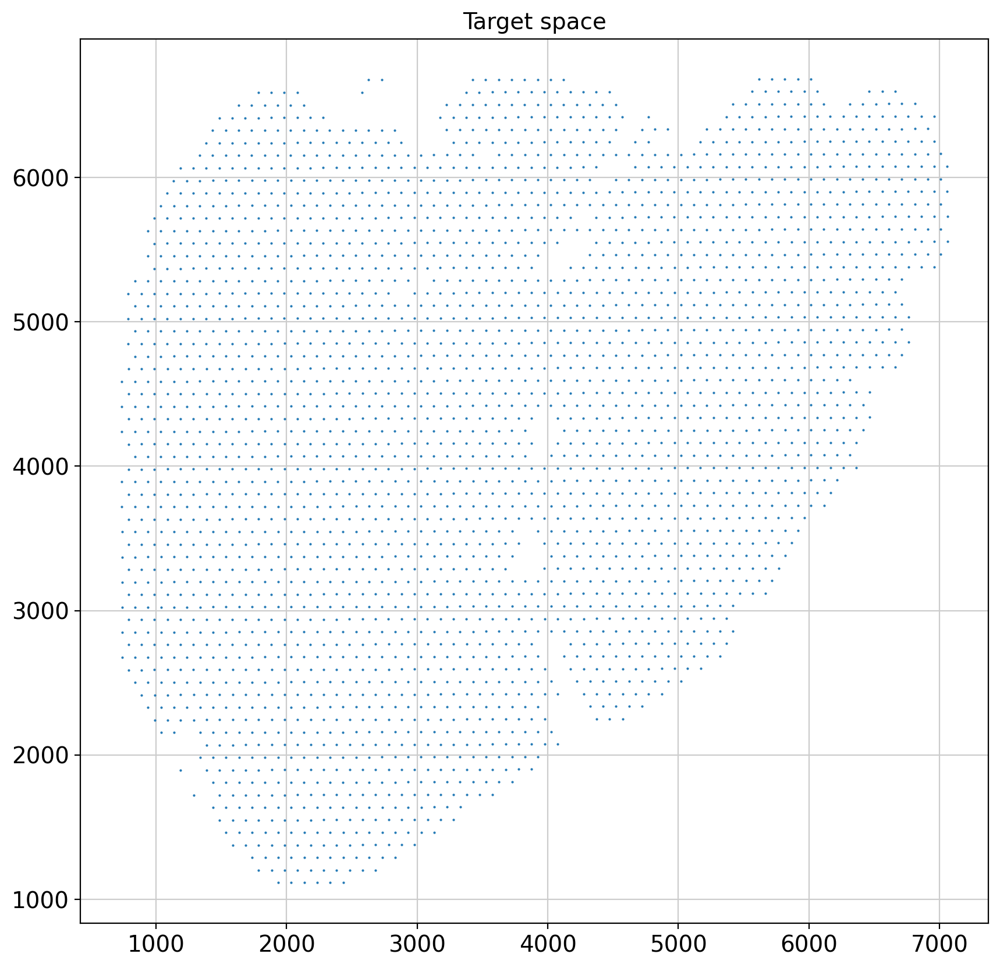

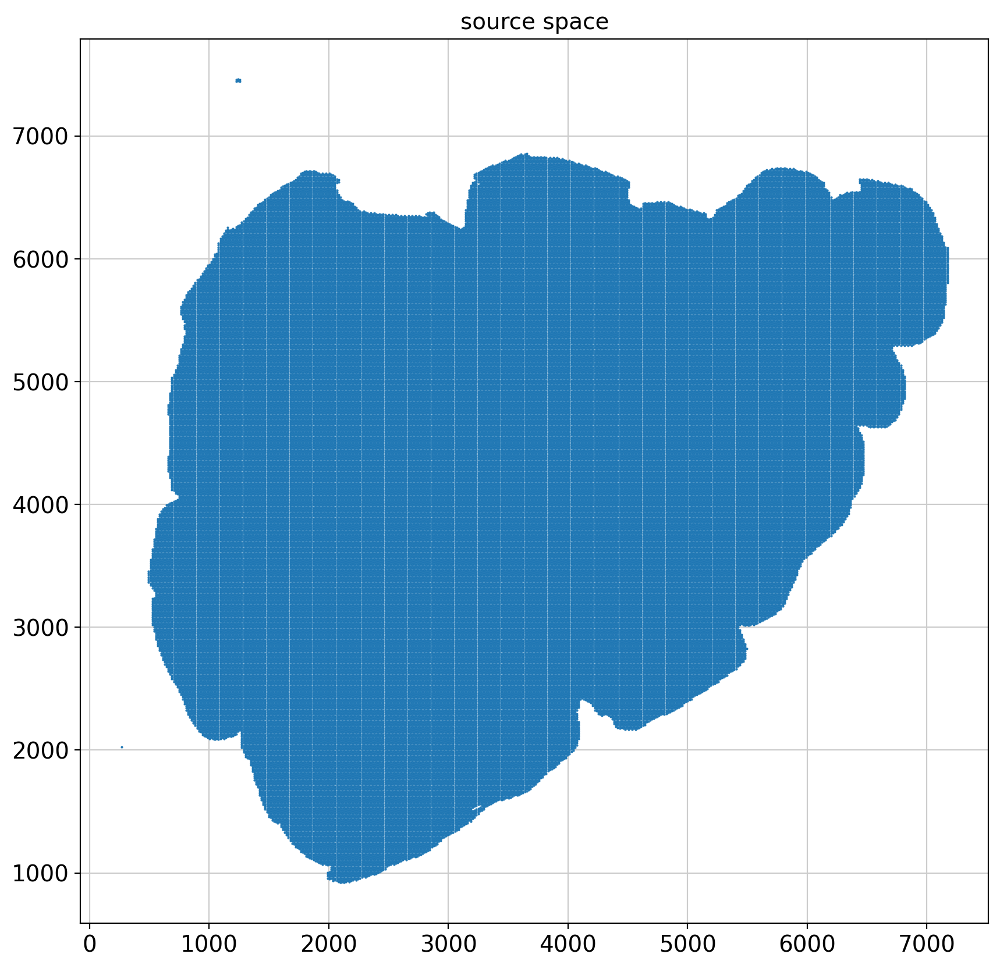

Migrating source annotation - annotations to target space.
Migrating source annotation - annotations_number to target space.
Migrating source annotation - L2_dist_annotations_Artifacts to target space.
Migrating source annotation - L2_dist_annotations_Cortex to target space.
Migrating source annotation - L2_dist_annotations_Edge to target space.
Migrating source annotation - L2_dist_annotations_HS to target space.
Migrating source annotation - L2_dist_annotations_Medulla to target space.
Migrating source annotation - L2_dist_annotations_Other to target space.
Migrating source annotation - L2_dist_annotations_PVS to target space.
Migrating source annotation - L2_dist_annotations_Vessels to target space.
Migrating source annotation - L2_dist_annotations_unassigned to target space.
Migrating source annotation - cma_3p to target space.
Migrating source annotation - cma_2p to target space.


,1,2,3,4,5,pxl_row_in_fullres,pxl_col_in_fullres,x,y,annotations,...,L2_dist_annotations_Cortex,L2_dist_annotations_Edge,L2_dist_annotations_HS,L2_dist_annotations_Medulla,L2_dist_annotations_Other,L2_dist_annotations_PVS,L2_dist_annotations_Vessels,L2_dist_annotations_unassigned,cma_3p,cma_2p
0,,,,,,,,,,,,,,,,,,,,,
GTATTCTTACCGTGCT-1,1.0,7.0,21.0,2648.165623,3936.403490,1201.223867,1785.576318,446.394080,300.305967,Edge,...,37.603251,12.670677,505.785927,459.780479,2088.319139,437.045517,4800.571080,41.293363,-0.778224,-0.946362
GCGGTAACCCAAATGA-1,1.0,7.0,23.0,2648.624365,4155.922017,1201.431955,1885.151243,471.287811,300.357989,Cortex,...,12.670677,66.074879,421.335453,380.283204,2087.231291,410.515589,4743.174986,108.641894,-0.612771,-0.703938
CTACGTGTTGCCACCA-1,1.0,6.0,24.0,2457.353859,4265.806292,1114.670502,1934.995412,483.748853,278.667626,Cortex,...,15.087331,20.468648,456.259821,415.108430,2173.418429,490.775949,4794.759338,58.714013,-0.713617,-0.906016
CTAGATAAACTCCTCG-1,1.0,7.0,25.0,2649.083106,4375.440543,1201.640043,1984.726168,496.181542,300.410011,Cortex,...,12.670677,94.967646,360.876683,319.768710,2106.287377,413.176918,4700.779787,143.722097,-0.586103,-0.542034
TCCATTAGTTGGATAG-1,1.0,6.0,26.0,2457.812601,4485.324818,1114.878590,2034.570337,508.642584,278.719648,Artifacts,...,22.731722,37.741364,413.800399,364.558869,2194.120518,491.507779,4753.774964,80.904397,-0.656449,-0.812372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTTGATGACCATCCAG-1,1.0,70.0,98.0,14730.319376,12379.991026,6681.761537,5615.638450,1403.909612,1670.440384,Edge,...,40.351810,13.038203,358.918830,152.486271,635.080466,309.823800,1886.068860,27.410809,-0.567514,-0.842462
CTTGCCCACCCACGCA-1,1.0,70.0,100.0,14730.778118,12599.509552,6681.969625,5715.213375,1428.803344,1670.492406,Cortex,...,15.087331,23.111183,344.446875,116.714316,718.303211,228.252159,1961.495302,66.728722,-0.574837,-0.669428
GGACAACCATGAAGCC-1,1.0,70.0,102.0,14731.236859,12819.028079,6682.177713,5814.788300,1453.697075,1670.544428,Artifacts,...,26.469523,39.025191,363.045638,98.461368,796.131996,184.271211,2032.111038,72.036947,-0.422662,-0.432305


In [22]:
# read visium info
_,ppm_vis,vis_df = tt.read_visium(spaceranger_dir_path=path+'/',res_in_ppm=0.25,plot=False)
vis_df.rename(columns={'pxl_col': "x", 'pxl_row': "y"},inplace=True) # for new spaceranger 
vis_df = tt.map_annotations_to_target(                            
    df_target=vis_df,  
    df_source=df_anno,
    ppm_target= ppm_vis,
    plot=True,
)
vis_df

In [24]:
# read visium full data 
import scanpy as sc
adata_vis = sc.read_visium(path,count_file='raw_feature_bc_matrix.h5')
# map annotations 
adata_vis.obs = pd.concat([adata_vis.obs,vis_df.iloc[:,2:]],axis=1)
adata_vis.obsm['spatial'] = adata_vis.obsm['spatial'].astype('int')
adata_vis

/nfs/team205/ny1/miniconda/miniconda3/envs/tissuetag/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 4992 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 3, 4, 5, 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'x', 'y', 'annotations', 'annotations_number', 'L2_dist_annotations_Artifacts', 'L2_dist_annotations_Cortex', 'L2_dist_annotations_Edge', 'L2_dist_annotations_HS', 'L2_dist_annotations_Medulla', 'L2_dist_annotations_Other', 'L2_dist_annotations_PVS', 'L2_dist_annotations_Vessels', 'L2_dist_annotations_unassigned', 'cma_3p', 'cma_2p'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

/nfs/team205/ny1/miniconda/miniconda3/envs/tissuetag/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


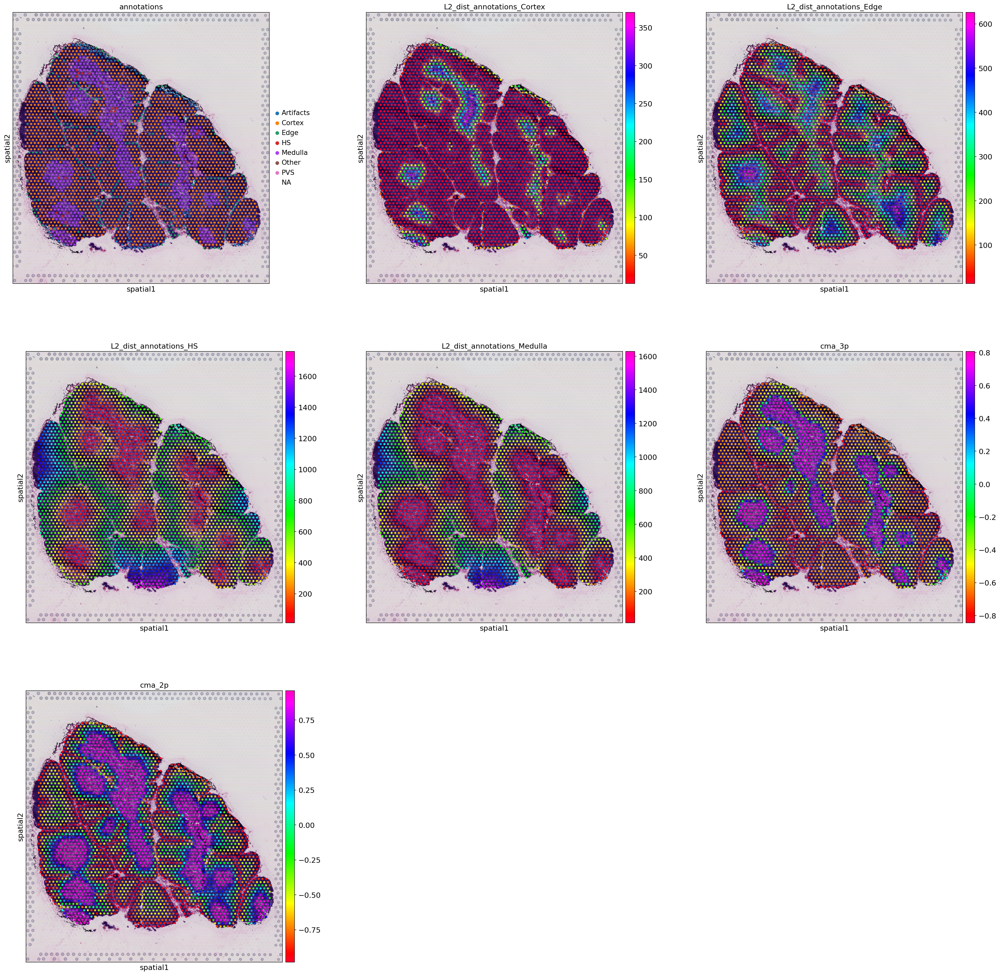

In [28]:
# plot the newly annotated visium AnnData
sc.set_figure_params(figsize=[10,10],dpi=75)
sc.pl.spatial(adata_vis,color=['annotations','L2_dist_annotations_Cortex', 'L2_dist_annotations_Edge', 'L2_dist_annotations_HS', 'L2_dist_annotations_Medulla', 'cma_3p', 'cma_2p']
              ,cmap='gist_rainbow',ncols=3)

In [17]:
#done!